### IMPORT

In [1]:
import os, sys
import subprocess
import numpy as np
import matplotlib.pyplot as plt
import torch

from PIL import ImageDraw, ImageFont
from IPython.display import Image, display
from torchvision import transforms

In [2]:
sys.path.append(os.path.abspath('..'))

from src.forward_diffusion import forward_diffusion_sample
from src.forward_diffusion import linear_beta_schedule, cosine_beta_schedule, sigmoid_beta_schedule, quadratic_beta_schedule
from src.data_loader import create_dataloader

In [3]:
# real data
file_name = 'SWFD_semicircle_RawBP.h5'
key = 'sc_BP'

# simulated data
# file_name = 'SCD_RawBP-mini.h5'
# key = 'vc_BP'

In [4]:
# oadat location
oadat_dir = 'C:/Users/carlo/OADAT'

### VISU FUNCTIONS

In [5]:
def print_image_statistics(image, title):
    img = np.squeeze(image).ravel()
    print(f"{title}:\nMin: {np.min(img):.4f}, Max: {np.max(img):.4f}, Mean: {np.mean(img):.4f}, "
          f"Median: {np.median(img):.4f}, Var: {np.var(img):.4f}, Std: {np.std(img):.4f}\n")

In [6]:
def visualize_forward_diffusion(x_0, timesteps, diffusion_vars):
    """ 
    x_0: The original image.
    timesteps: List of timesteps to visualize.
    diffusion_vars: Precomputed diffusion variables
    """

    fontsize = 12
    axis_font = 12
    fig, axes = plt.subplots(len(timesteps), 3, figsize=(10, 3 * len(timesteps)))

    # Generate pure random noise for comparison
    random_noise = torch.randn_like(x_0)

    for idx, t in enumerate(timesteps):
        # Perform forward diffusion for a given timestep
        x_t, noise = forward_diffusion_sample(x_0, t, diffusion_vars)

        # Plot original and noisy image
        axes[idx, 0].imshow(x_0.squeeze().cpu().numpy(), cmap='gray')
        axes[idx, 0].set_title(f"Original Image", fontsize=fontsize)
        axes[idx, 0].axis('off')

        axes[idx, 1].imshow(x_t.squeeze().cpu().numpy(), cmap='gray')
        axes[idx, 1].set_title(f"Noisy Image at t={t}", fontsize=fontsize)
        axes[idx, 1].axis('off')

        # Plot histogram of pixel intensities
        if idx == len(timesteps) - 1:
            # For the last timestep, compare noisy image to random noise, and also show original
            axes[idx, 2].hist(x_0.cpu().numpy().flatten(), bins=50, color='orange', alpha=0.6, label='Original')
            axes[idx, 2].hist(x_t.cpu().numpy().flatten(), bins=50, color='blue', alpha=0.3, label=f'Noisy')
            axes[idx, 2].hist(random_noise.cpu().numpy().flatten(), bins=50, color='red', histtype='step', linewidth=2, label='Gaussian')
            axes[idx, 2].set_title(f"Histogram at t={t}", fontsize=fontsize)
        else:
            # Normal noisy image comparison with the original
            axes[idx, 2].hist(x_0.cpu().numpy().flatten(), bins=50, color='orange', alpha=1, label='Original')
            axes[idx, 2].hist(x_t.cpu().numpy().flatten(), bins=50, color='blue', alpha=0.3, label=f'Noisy')
            axes[idx, 2].set_title(f"Histogram at t={t}", fontsize=fontsize)

        axes[idx, 2].set_yscale('log')
        axes[idx, 2].set_xlim(-6, 6)
        axes[idx, 2].legend(fontsize=fontsize)
        axes[idx, 2].tick_params(axis='both', labelsize=axis_font)

    plt.tight_layout()
    plt.show()



In [7]:
def diffusion_analysis(dataloader, diffusion_vars, timesteps_to_plot):
    # Load a random image from the batch
    batch = next(iter(dataloader))
    random_idx = np.random.randint(0, len(batch))
    image = batch[random_idx].numpy()  # Convert to numpy

    print_image_statistics(image, "Original Image")  # Display statistics for the original image

    # Convert back to torch.Tensor for diffusion process
    x_0 = torch.from_numpy(image).to(torch.float32)

    visualize_forward_diffusion(x_0, timesteps_to_plot, diffusion_vars)


In [8]:
def plot_noise_add(dataloader, diffusion_vars, timesteps, timestep):
    # Fetch a random batch and select a random image x_0
    batch = next(iter(dataloader))
    random_idx = np.random.randint(0, len(batch))
    x_0 = batch[random_idx].unsqueeze(0)

    # timestep
    t = timestep if timestep < timesteps else timesteps - 1  # Ensure t is within range
    
    # Apply forward diffusion
    x_t, noise = forward_diffusion_sample(x_0, t, diffusion_vars)
    
    # Convert tensors to CPU and detach for plotting
    x_0 = x_0.cpu().squeeze().detach().numpy()
    x_t = x_t.cpu().squeeze().detach().numpy()
    noise = noise.cpu().squeeze().detach().numpy()

    # Plot: original image, noisy image, noise
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"Forward Diffusion at Timestep {t}", fontsize=16)
    
    for ax, img, title in zip(axes, [x_0, x_t, noise], ["Original Image (x_0)", f"Noisy Image (x_t) at t={t}", "Noise Added"]):
        ax.imshow(img, cmap="gray")
        ax.set_title(title)
        ax.axis("off")
    
    plt.show()

In [9]:
def plot_time_schedules(plot_till, cosine_schedule, linear_schedule, quadratic_schedule, sigmoid_schedule, timesteps):

    fontsize = 12
    axis_font = 12
    
    # Print final beta values for each schedule
    print(f"Final beta values after {timesteps} timesteps:")
    print(f"Cosine Schedule: {cosine_schedule[-1]:.2f}")
    print(f"Linear Schedule: {linear_schedule[-1]:.2f}")
    print(f"Quadratic Schedule: {quadratic_schedule[-1]:.2f}")
    print(f"Sigmoid Schedule: {sigmoid_schedule[-1]:.2f}")
    
    # Plot the schedules up to 'plot_till' timesteps
    plt.figure(figsize=(10, 6))
    plt.plot(cosine_schedule[:plot_till], label='Cosine Schedule')
    plt.plot(linear_schedule[:plot_till], label='Linear Schedule')
    plt.plot(quadratic_schedule[:plot_till], label='Quadratic Schedule')
    plt.plot(sigmoid_schedule[:plot_till], label='Sigmoid Schedule')
    
    # Set plot title and labels with custom font size
    plt.title('Beta Schedules for Different Timesteps', fontsize=fontsize)
    plt.xlabel('Timestep', fontsize=fontsize)
    plt.ylabel('Beta Value', fontsize=fontsize)
    plt.yscale('log')  # Set y-axis to logarithmic scale

    # Customize legend and ticks
    plt.legend(fontsize=fontsize)
    plt.xticks(fontsize=axis_font)
    plt.yticks(fontsize=axis_font)


    plt.grid(True)
    plt.show()

In [10]:
def plot_forward_grid(dataloader, diffusion_vars, timesteps_to_plot, num_images=4):
    # Fetch a batch from the dataloader
    batch = next(iter(dataloader))[:num_images]  # Limit to `num_images`
    batch = batch.unsqueeze(1)  # Add a singleton channel dimension if needed

    # Prepare a grid for plotting
    fig, ax = plt.subplots(num_images, len(timesteps_to_plot), figsize=(15, num_images * 2), facecolor='white')
    
    # Generate and plot noisy images for each image and timestep
    for i, x_0 in enumerate(batch):
        for j, t in enumerate(timesteps_to_plot):
            x_t, _ = forward_diffusion_sample(x_0, t, diffusion_vars)
            noisy_image = x_t.cpu().squeeze().detach().numpy()  # Convert to numpy for plotting

            # Plot each image in the appropriate subplot
            if num_images > 1:
                ax[i, j].imshow(noisy_image, cmap="gray")
                ax[i, j].axis("off")
                if i == 0:  # Set title only for the first row
                    ax[i, j].set_title(f"t={t}", fontsize=11)
            else:
                ax[j].imshow(noisy_image, cmap="gray")
                ax[j].axis("off")
                ax[j].set_title(f"t={t}", fontsize=8)

    # Apply tight layout for minimal spacing
    plt.tight_layout()
    plt.show()


In [11]:
def rescale_image(tensor):
    scaled_tensor = (tensor - tensor.min()) / (tensor.max() - tensor.min() + 1e-5)
    return (scaled_tensor * 255).type(torch.uint8)

def add_frame_number(image, frame_number):
    draw = ImageDraw.Draw(image)
    font = ImageFont.truetype("arial.ttf", 30)
    draw.text((10, 10), f"t = {frame_number}", fill="white", font=font)
    return image

def generate_forward_diffusion_images(x_0, timesteps, diffusion_vars):
    to_pil = transforms.ToPILImage()
    return [to_pil(rescale_image(forward_diffusion_sample(x_0, torch.tensor([t]), diffusion_vars)[0].squeeze())) for t in range(timesteps)]

def create_forward_gif(imgs, step=10, duration=50):
    gif_path = "forward.gif"
    images_with_numbers = [add_frame_number(img.copy(), i) for i, img in enumerate(imgs)]
    selected_images = images_with_numbers[::step] + [images_with_numbers[-1]]
    
    selected_images[0].save(
        gif_path,
        save_all=True,
        append_images=selected_images[1:],
        duration=duration,
        loop=1  # Loop indefinitely (plays forward and backward seamlessly)
    )
    print(f"GIF saved as => {gif_path}")

### EXPLORATION

In [12]:
# Main execution
batch_size = 64
norm_params = {"norm": 'norm1_scaleclip'}
prng = np.random.RandomState(42)
dataloader = create_dataloader(oadat_dir, file_name, key, norm_params['norm'], batch_size, 
                               shuffle=True, num_workers=0, prng=prng, indices=None)

In [13]:
timesteps = 1000

# Scheduler for forward diffusion. uncomment the one wanted

# betas = linear_beta_schedule(timesteps, beta_start = 0.00001, beta_end = 0.01)
betas = cosine_beta_schedule(timesteps, s=0.04, beta_end=0.5)
# betas = sigmoid_beta_schedule(timesteps, beta_start = 0.00001, beta_end = 0.01)

# diffusion vars calculation
sqrt_alphas_cumprod = torch.cumprod(1 - betas, dim=0).sqrt()
sqrt_one_minus_alphas_cumprod = (1 - torch.cumprod(1 - betas, dim=0)).sqrt()

diffusion_vars = {
    'sqrt_alphas_cumprod': sqrt_alphas_cumprod,
    'sqrt_one_minus_alphas_cumprod': sqrt_one_minus_alphas_cumprod,
}

Final beta values after 1000 timesteps:
Cosine Schedule: 0.50
Linear Schedule: 0.01
Quadratic Schedule: 0.01
Sigmoid Schedule: 0.01


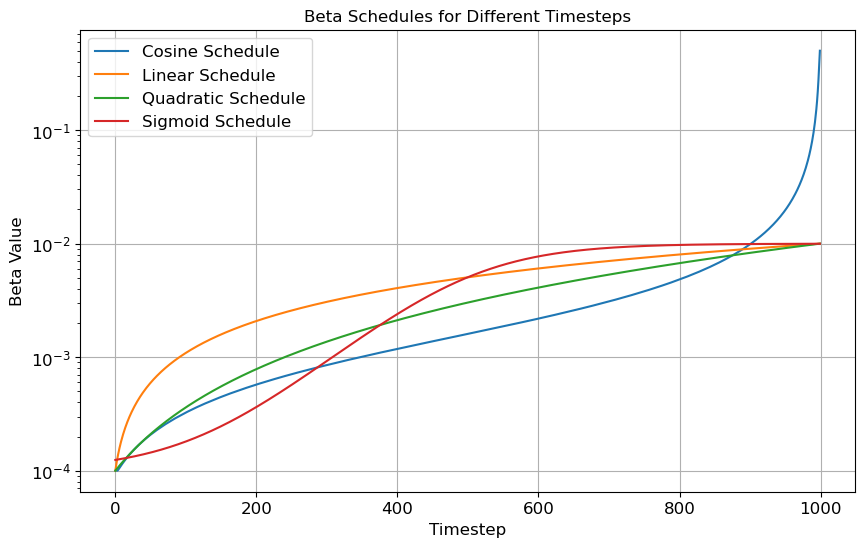

In [14]:
linear_schedule = linear_beta_schedule(timesteps, beta_start = 0.0001, beta_end = 0.01).numpy()
cosine_schedule = cosine_beta_schedule(timesteps, s=0.04, beta_end=0.5).numpy()
sigmoid_schedule = sigmoid_beta_schedule(timesteps, beta_start = 0.0001, beta_end = 0.01).numpy()
quadratic_schedule = quadratic_beta_schedule(timesteps, beta_start = 0.0001, beta_end = 0.01).numpy()

plot_till = 1000
plot_time_schedules(plot_till, cosine_schedule, linear_schedule, quadratic_schedule, sigmoid_schedule, timesteps)

Original Image:
Min: -1.0000, Max: 1.0000, Mean: -0.6657, Median: -0.6659, Var: 0.0025, Std: 0.0503



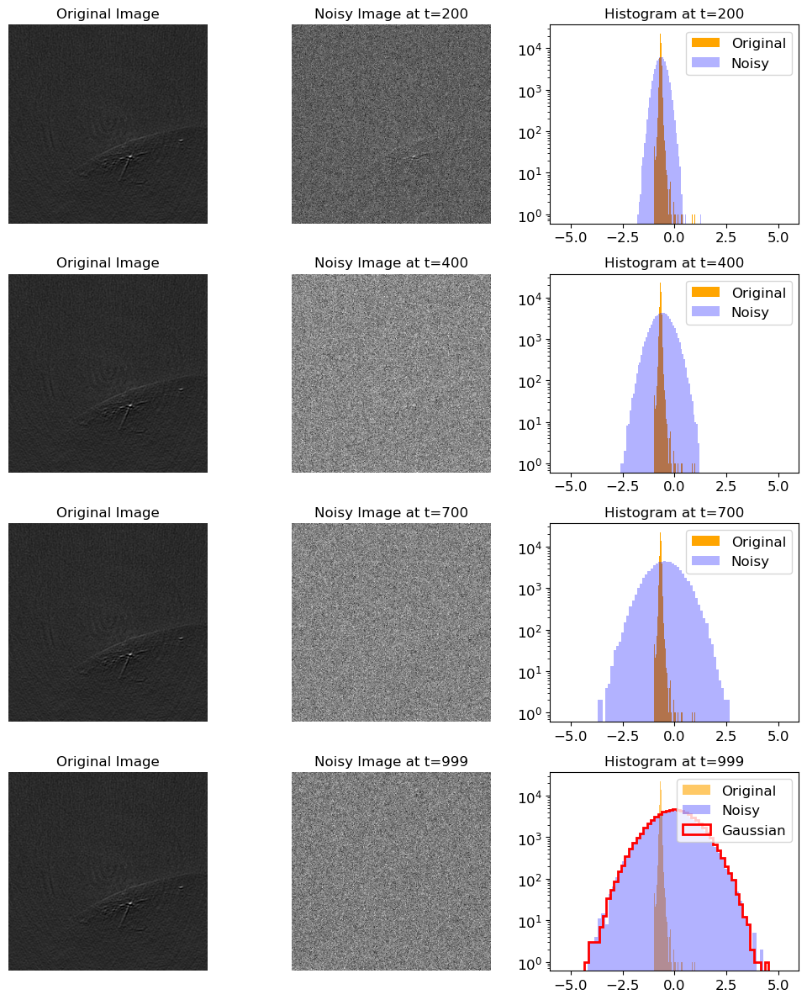

In [15]:
timesteps_to_plot = [
                     timesteps//100*20,
                     timesteps//100*40, 
                     timesteps//100*70, 
                     timesteps-1] 

diffusion_analysis(dataloader, diffusion_vars, timesteps_to_plot)

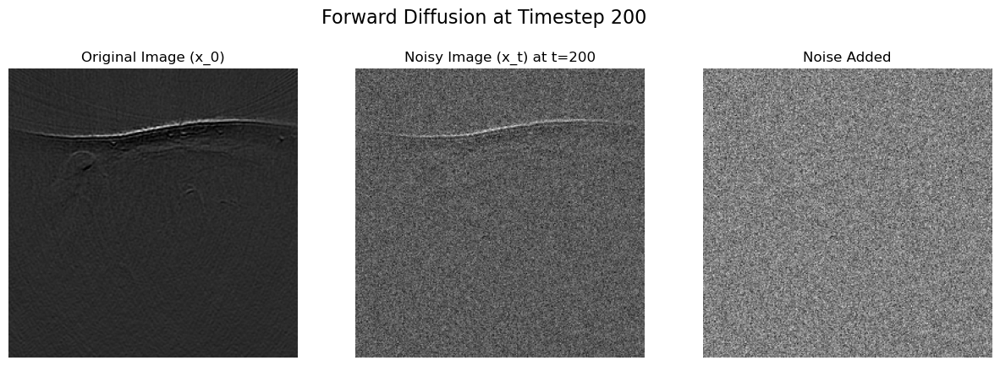

In [16]:
timestep = timesteps//10 * 2 
plot_noise_add(dataloader, diffusion_vars, timesteps, timestep)

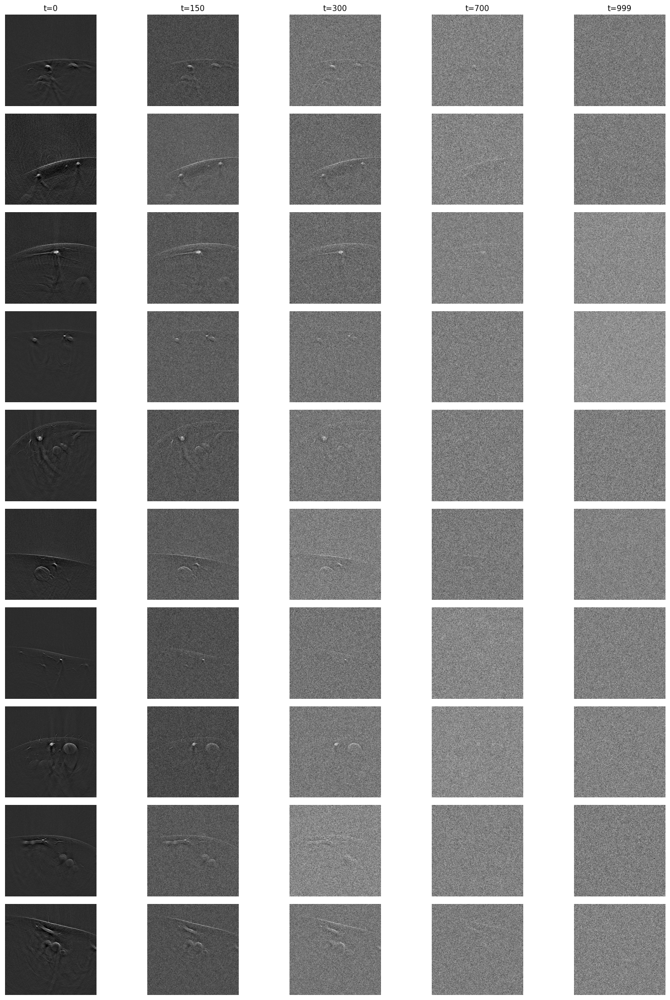

In [17]:
timesteps_to_plot = [0, 
                     timesteps//100 * 15,
                     timesteps//100 * 30,
                     timesteps//100 * 70, 
                     timesteps-1]

plot_forward_grid(dataloader, diffusion_vars, timesteps_to_plot, num_images=10)

### GIF

In [18]:
timesteps = 1000

# Fetch a single batch
single_batch = next(iter(dataloader))
# Access  image 
x_0 = single_batch[3]


In [19]:
# Generate images
imgs = generate_forward_diffusion_images(x_0, timesteps, diffusion_vars)

In [20]:
create_forward_gif(imgs, step=10, duration=150)

GIF saved as => forward.gif


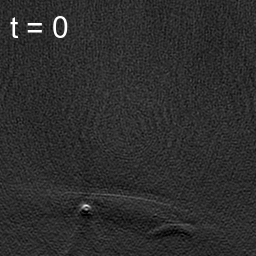

In [21]:
gif_path = "forward.gif"
display(Image(filename=gif_path))
